In [1]:
import json

# Example current format data
with open('alphapose-results-moderate (1).json','rb') as fh:
    data = json.load(fh)
data

[{'image_id': '0.jpg',
  'category_id': 1,
  'keypoints': [277.1247863769531,
   353.28485107421875,
   0.04321325197815895,
   39.846351623535156,
   485.106201171875,
   0.05014161765575409,
   -34.85240936279297,
   225.8575439453125,
   0.04275891184806824,
   575.9197998046875,
   599.3513793945312,
   0.1116660013794899,
   180.45579528808594,
   652.0798950195312,
   0.046400949358940125,
   690.1649780273438,
   1249.6700439453125,
   0.03719213604927063,
   136.5153350830078,
   599.3513793945312,
   0.14863650500774384,
   646.2245483398438,
   1267.2462158203125,
   0.4275285005569458,
   628.6483764648438,
   1249.6700439453125,
   0.11860683560371399,
   -34.85240936279297,
   243.4337158203125,
   0.13347965478897095,
   382.58184814453125,
   906.9345092773438,
   0.5391024351119995,
   224.396240234375,
   388.43719482421875,
   0.1254216879606247,
   -52.4285888671875,
   225.8575439453125,
   0.061260562390089035,
   39.846351623535156,
   485.106201171875,
   0.10920

In [2]:

# Initialize MMSkeleton format
mmskeleton_data = {
    "data": {
        "keypoint": []
    },
    "frame_dir": "video_name",  # Set video name here
    "img_shape": [720, 1280],  # Example: height and width of the video
    "original_shape": [720, 1280],
    "total_frames": len(data)
}


In [3]:
bounding = []
# Process each frame and extract keypoints
for frame_data in data:
    keypoints = frame_data["keypoints"]
    frame_keypoints = []
    # Group keypoints in sets of 3 (x, y, confidence)
    for i in range(0, len(keypoints), 3):
        frame_keypoints.append([keypoints[i], keypoints[i + 1], keypoints[i + 2]])
    # Append to the keypoint list in MMSkeleton format
    mmskeleton_data["data"]["keypoint"].append([frame_keypoints])
    bounding.append(frame_data["box"])

# Example label for the video, adjust accordingly
mmskeleton_data["data"]["label"] = 0

# Convert to JSON
json_data = json.dumps(mmskeleton_data, indent=4)
print(json_data)
print(bounding)

{
    "data": {
        "keypoint": [
            [
                [
                    [
                        277.1247863769531,
                        353.28485107421875,
                        0.04321325197815895
                    ],
                    [
                        39.846351623535156,
                        485.106201171875,
                        0.05014161765575409
                    ],
                    [
                        -34.85240936279297,
                        225.8575439453125,
                        0.04275891184806824
                    ],
                    [
                        575.9197998046875,
                        599.3513793945312,
                        0.1116660013794899
                    ],
                    [
                        180.45579528808594,
                        652.0798950195312,
                        0.046400949358940125
                    ],
                    [
                        690.16

In [4]:
json_data = json.loads(json_data)

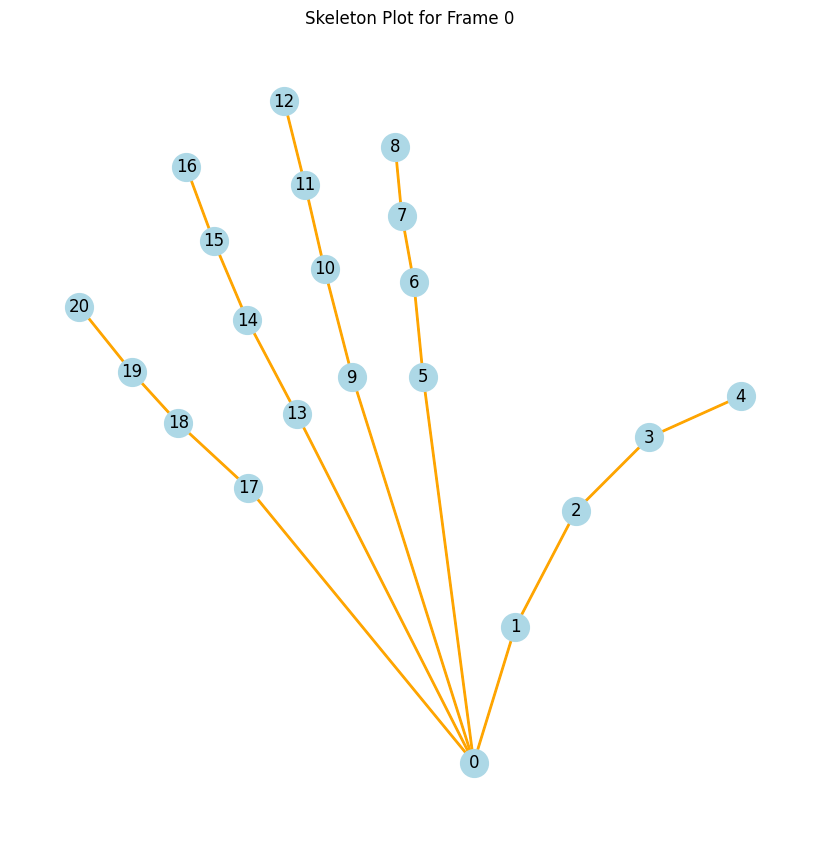

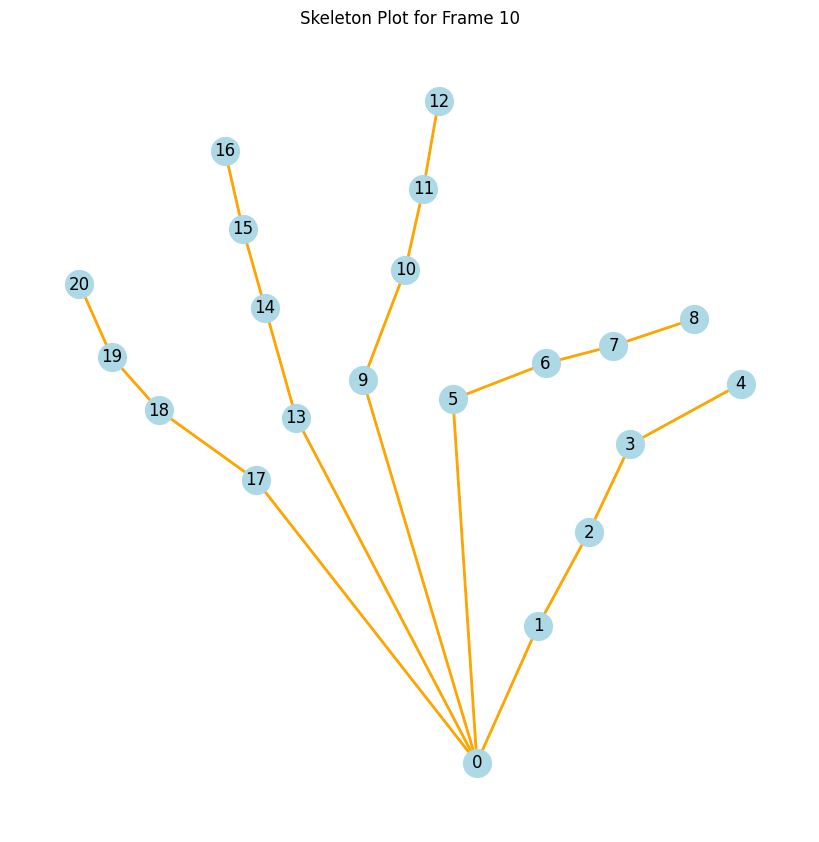

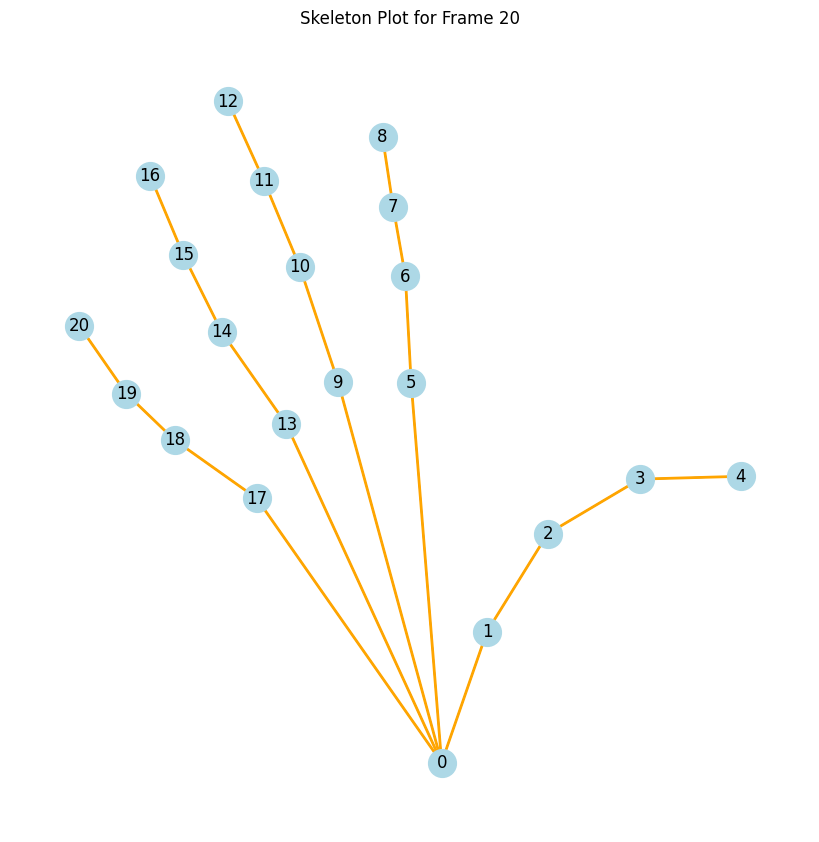

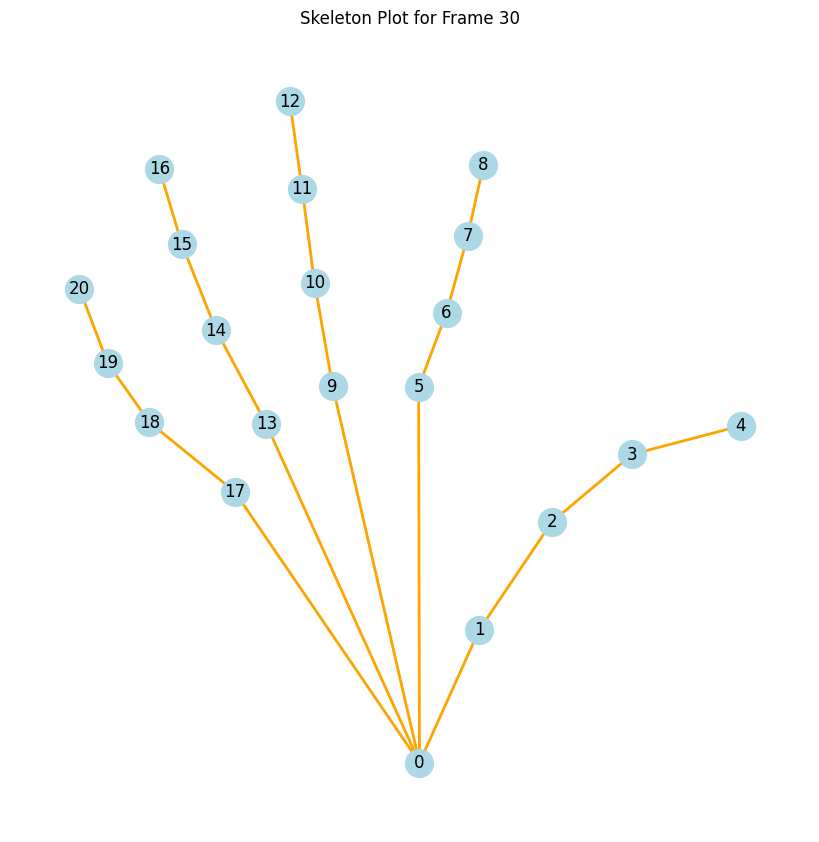

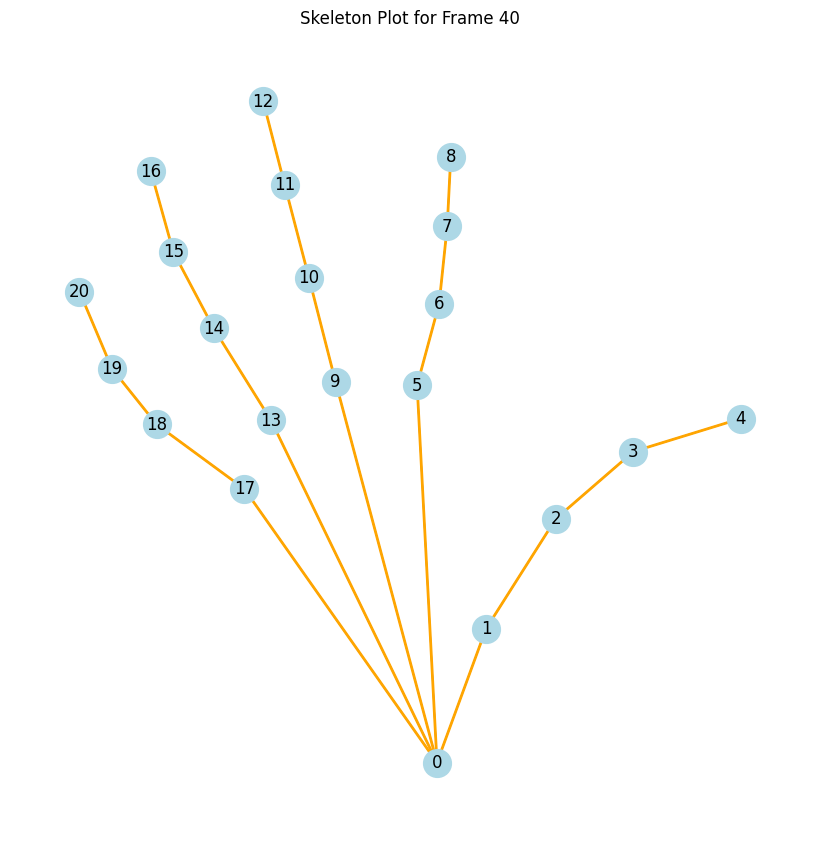

...

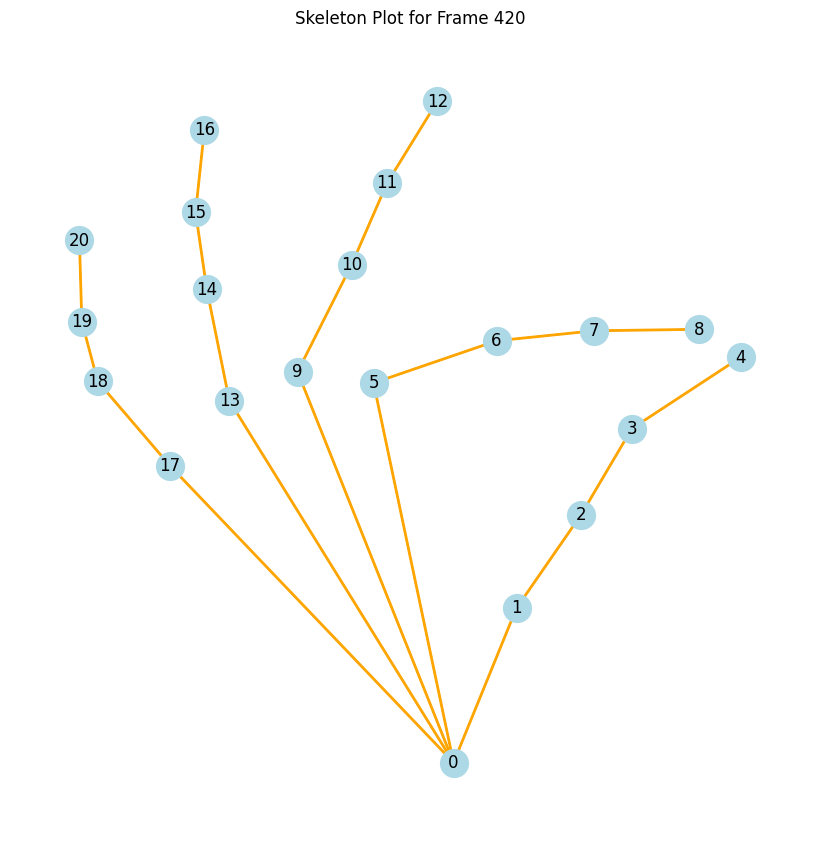

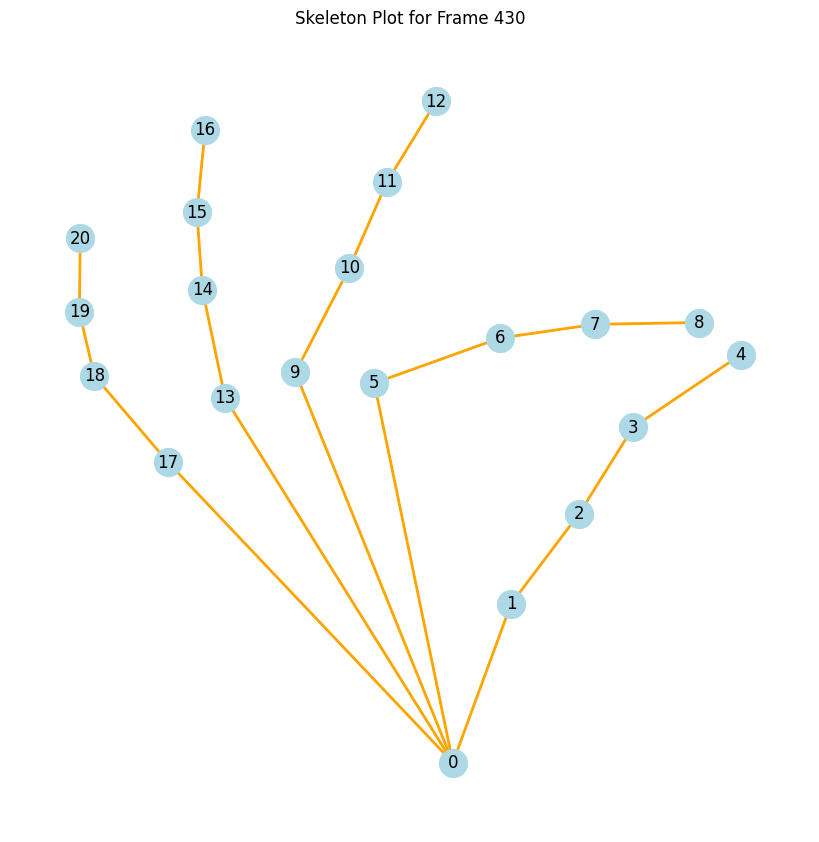

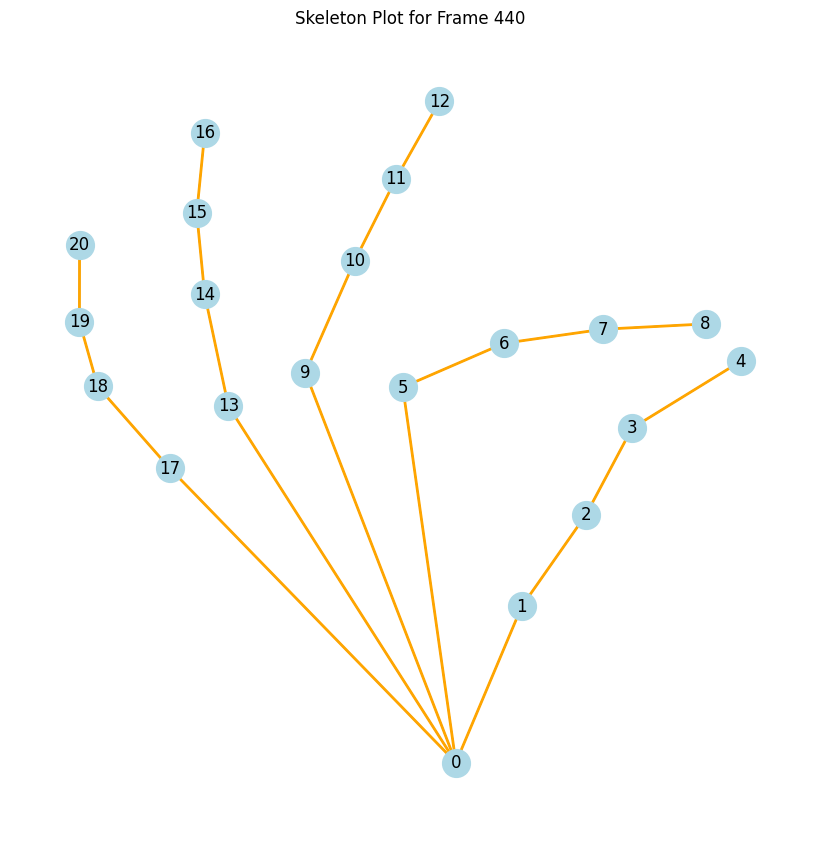

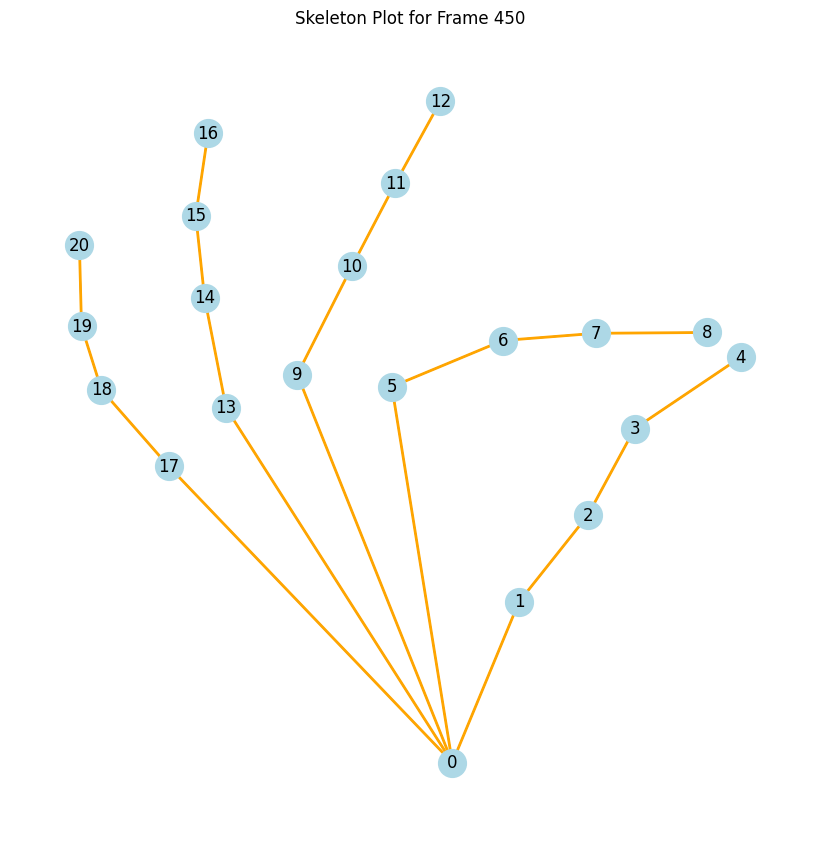

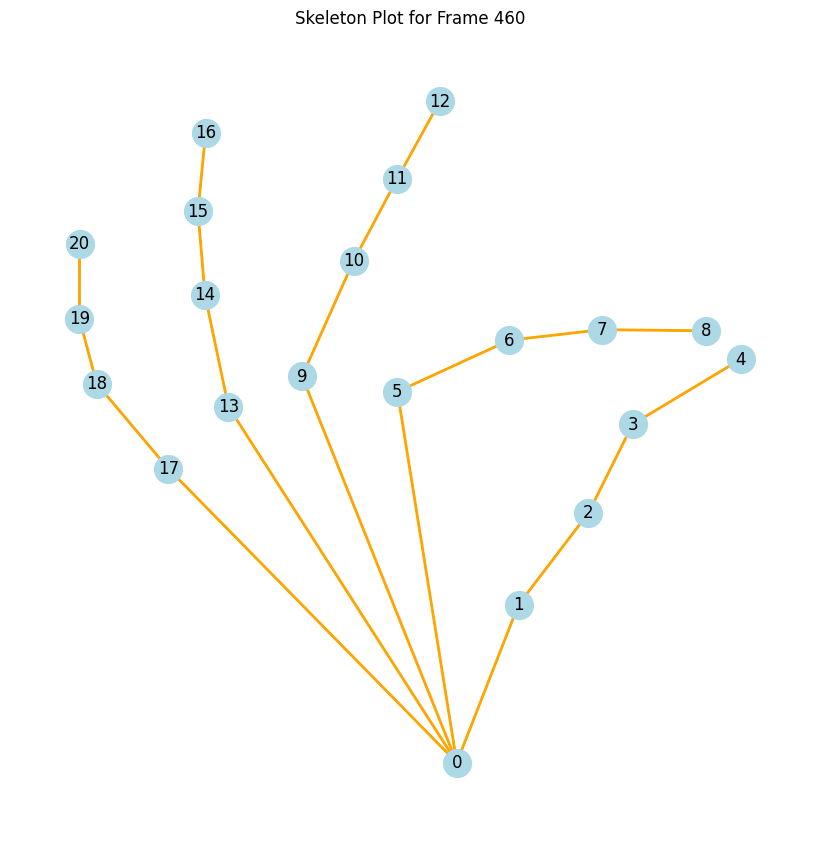

In [5]:
import json
import matplotlib.pyplot as plt
import networkx as nx

""" skeleton_edges = [
    (47, 48), (48, 49), (49, 50), (50, 51), 
    (47, 52), (52, 53), (53, 54), (54, 55),
    (47, 56), (56, 57), (57, 58), (58, 59),
    (47, 60), (60, 61), (61, 62), (62, 63),
    (47, 64), (64, 65), (65, 66), (66, 67),
] """
skeleton_edges = [
    (0, 1), (18, 17), (18, 19), (18, 25), (19, 20), (20, 21), 
    (0, 13), (13, 14), (14, 15), (15, 16),
    (0, 9), (9, 10), (10, 11), (11, 12),
    (0, 5), (5, 6), (6, 7), (7, 8),
    (0, 17), (1, 2), (2, 3), (3, 4),
]
hand_parts = [47, 64, 65, 66, 67, 60, 61, 62, 63, 56, 57, 58, 59, 52, 53, 54, 55, 48, 49, 50, 51]

""" skeleton_edges = [
    (15, 27), (27, 28), (28, 29), (29, 30), 
    (15, 31), (31, 32), (32, 33), (33, 34),
    (15, 35), (35, 36), (36, 37), (37, 38),
    (15, 39), (39, 40), (40, 41), (41, 42),
    (15, 43), (43, 44), (44, 45), (45, 46),
] """
frames = json_data["data"]["keypoint"]
main_kp = []
# Iterate through frames and plot every 20th frame
for frame_index in range(len(frames)):
        if frame_index % 10 == 0:
            frame_keypoints = frames[frame_index][0]  # Get keypoints for the current frame

            # Extract (x, y) positions, ignoring confidence scores
            keypoints = [(frame_keypoints[kp][0], frame_keypoints[kp][1]) for kp in range(len(frame_keypoints)) if kp in hand_parts]
            main_kp.append(keypoints)
            # Create a graph to plot keypoints and connections
            G = nx.Graph()
            for idx, (x, y) in enumerate(keypoints):
                G.add_node(idx, pos=(x, y))

            # Add edges based on the skeleton structure
            for edge in skeleton_edges:
                if edge[0] < len(keypoints) and edge[1] < len(keypoints):  # Check if keypoints exist
                    G.add_edge(edge[0], edge[1])

            # Plotting
            plt.figure(figsize=(8, 8))
            pos = nx.get_node_attributes(G, 'pos')
            nx.draw(G, pos, node_size=400, node_color='lightblue', with_labels=True)
            nx.draw_networkx_edges(G, pos, width=2, edge_color='orange')  # Draw edges
            plt.title(f"Skeleton Plot for Frame {frame_index}")
            plt.gca().invert_yaxis()
            plt.show()




In [6]:
main_kp

[[(395.6975402832031, 918.3632202148438),
  (431.87158203125, 799.822509765625),
  (484.78936767578125, 698.3516845703125),
  (548.5947875976562, 634.323974609375),
  (628.0072631835938, 598.47412109375),
  (351.65869140625, 581.6553344726562),
  (343.5185852050781, 498.943603515625),
  (333.0895080566406, 440.95196533203125),
  (327.3019104003906, 380.6410827636719),
  (290.1145324707031, 581.90771484375),
  (265.7734375, 487.50762939453125),
  (248.83767700195312, 414.00823974609375),
  (230.66831970214844, 341.083251953125),
  (241.64599609375, 614.0244750976562),
  (198.56150817871094, 532.1589965820312),
  (169.2247772216797, 462.8615417480469),
  (145.35597229003906, 398.2521057128906),
  (199.5233154296875, 678.6189575195312),
  (138.4761199951172, 621.9784545898438),
  (97.79708099365234, 577.120849609375),
  (52.37215805053711, 520.342529296875)],
 [(407.6910705566406, 915.4488525390625),
  (447.9629211425781, 791.1571044921875),
  (481.3863525390625, 706.3246459960938),
  (50

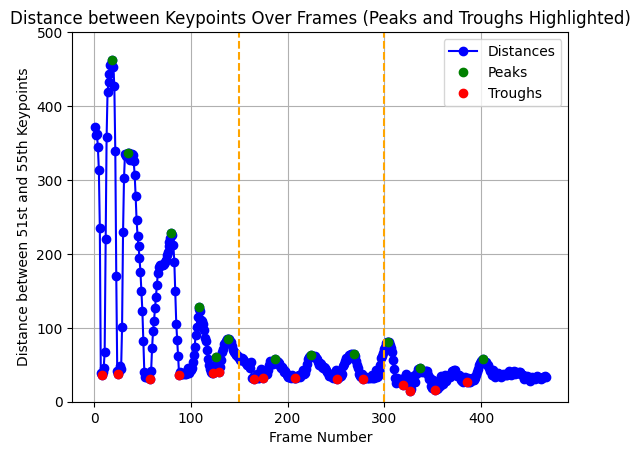

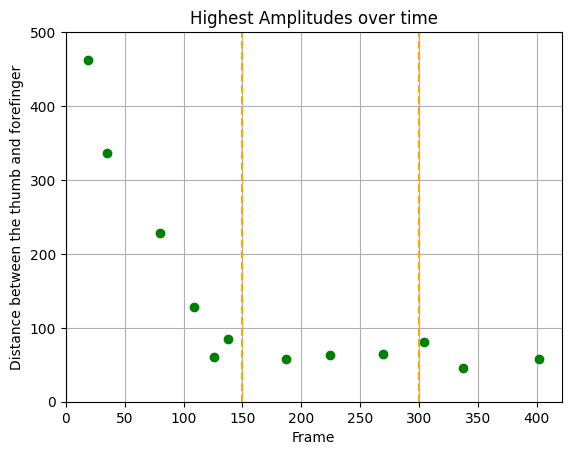

In [7]:
import json
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# Assuming json_data is a string, we need to parse it
if isinstance(json_data, str):
    json_data = json.loads(json_data)

# Prepare a list to store distances for each frame
distances = []

# Get all frames from the JSON data
frames = json_data["data"]["keypoint"]

# Define the distance calculation function
def calculate_distance(x1, y1, x2, y2):
    return np.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)

# Iterate through frames and calculate the distance for each
for frame_index in range(len(frames)):
    frame = frames[frame_index][0]
    
    # Extract (x55, y55, c55) and (x51, y51, c51) for the current frame
    x55, y55, c55 = frame[55]  # 55th keypoint (index 54)
    x51, y51, c51 = frame[51]  # 51st keypoint (index 50)
    
    # Calculate the distance between the 51st and 55th keypoints
    distance = calculate_distance(x55, y55, x51, y51)
    
    # Store the calculated distance
    distances.append(distance)

# Convert distances to a numpy array
distances_array = np.array(distances)

# Find only local maxima (peaks) and local minima (troughs) separately
peaks_indices, _ = find_peaks(distances_array, distance=5, prominence=20)  # Adjust prominence for clearer peak detection
troughs_indices, _ = find_peaks(-distances_array, distance=5, prominence=10)  # Detect troughs by finding peaks in the negative array

# Extract the highest points (distances) at the found peaks and lowest points at the troughs
highest_points = distances_array[peaks_indices]
lowest_points = distances_array[troughs_indices]

# Plot the distances and highlight only the peaks and troughs
fig, ax = plt.subplots()


ax.set_ylim(0, 500)
ax.plot(range(1, len(distances) + 1), distances_array, marker='o', color='blue', label='Distances')
ax.plot(peaks_indices + 1, highest_points, marker='o', color='green', linestyle='None', label='Peaks')
ax.plot(troughs_indices + 1, lowest_points, marker='o', color='red', linestyle='None', label='Troughs')
ax.set_xlabel("Frame Number")
ax.set_ylabel("Distance between 51st and 55th Keypoints")
ax.set_title("Distance between Keypoints Over Frames (Peaks and Troughs Highlighted)")
ax.legend()
plt.grid(True)
for i in [150, 300]:
    ax.axvline(x=i, color='orange', linestyle='--')

plt.show()


# Separate plot for the highest points (amplitudes over time)
figure, ax = plt.subplots()
ax.set_ylim(0, 500)
ax.plot(peaks_indices + 1, highest_points, marker='o', color='green', linestyle='None')
ax.set_xlabel("Frame")
ax.set_ylabel("Distance between the thumb and forefinger")
ax.set_title('Highest Amplitudes over time')
plt.grid(True)
for i in [150, 300]:
    ax.axvline(x=i, color='orange', linestyle='--')

plt.show()



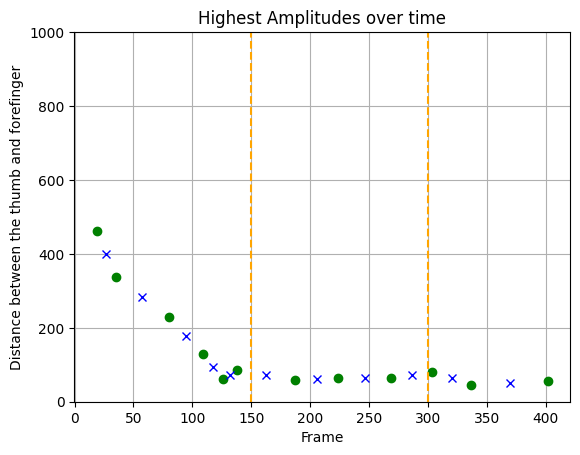

In [8]:
import json
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from scipy.interpolate import interp1d

if isinstance(json_data, str):
    json_data = json.loads(json_data)

# Prepare a list to store distances for each frame
distances = []

# Get all frames from the JSON data
frames = json_data["data"]["keypoint"]

# Define the distance calculation function
def calculate_distance(x1, y1, x2, y2):
    return np.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)

# Iterate through frames and calculate the distance for each
for frame_index in range(len(frames)):
    frame = frames[frame_index][0]
    
    # Extract (x55, y55, c55) and (x51, y51, c51) for the current frame
    x55, y55, c55 = frame[55]  # 55th keypoint (index 54)
    x51, y51, c51 = frame[51]  # 51st keypoint (index 50)
    
    # Calculate the distance between the 51st and 55th keypoints
    distance = calculate_distance(x55, y55, x51, y51)
    
    # Store the calculated distance
    distances.append(distance)

# Convert distances to a numpy array
distances_array = np.array(distances)

# Find only local maxima (peaks) and local minima (troughs) separately
peaks_indices, _ = find_peaks(distances_array, distance=5, prominence=20)  # Adjust prominence for clearer peak detection
troughs_indices, _ = find_peaks(-distances_array, distance=5, prominence=10)  # Detect troughs by finding peaks in the negative array

# Extract the highest points (distances) at the found peaks and lowest points at the troughs
highest_points = distances_array[peaks_indices]
lowest_points = distances_array[troughs_indices]


# Separate plot for the highest points (amplitudes over time)
figure, ax = plt.subplots()
ax.set_ylim(0, 1000)
ax.plot(peaks_indices + 1, highest_points, marker='o', color='green', linestyle='None')
ax.set_xlabel("Frame")
ax.set_ylabel("Distance between the thumb and forefinger")
ax.set_title('Highest Amplitudes over time')
plt.grid(True)
for i in [150, 300]:
    ax.axvline(x=i, color='orange', linestyle='--')

# Add one point between every two points
for i in range(len(peaks_indices) - 1):
    x_mid = (peaks_indices[i] + peaks_indices[i + 1]) / 2 + 1
    y_mid = (highest_points[i] + highest_points[i + 1]) / 2
    ax.plot(x_mid, y_mid, marker='x', color='blue', linestyle='None')


plt.show()



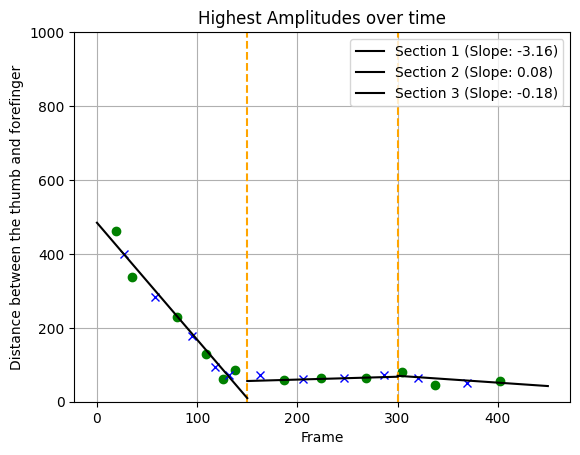

In [9]:
import json
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from scipy.interpolate import interp1d

if isinstance(json_data, str):
    json_data = json.loads(json_data)

# Prepare a list to store distances for each frame
distances = []

# Get all frames from the JSON data
frames = json_data["data"]["keypoint"]

# Define the distance calculation function
def calculate_distance(x1, y1, x2, y2):
    return np.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)

# Iterate through frames and calculate the distance for each
for frame_index in range(len(frames)):
    frame = frames[frame_index][0]
    
    # Extract (x55, y55, c55) and (x51, y51, c51) for the current frame
    x55, y55, c55 = frame[55]  # 55th keypoint (index 54)
    x51, y51, c51 = frame[51]  # 51st keypoint (index 50)
    
    # Calculate the distance between the 51st and 55th keypoints
    distance = calculate_distance(x55, y55, x51, y51)
    
    # Store the calculated distance
    distances.append(distance)

# Convert distances to a numpy array
distances_array = np.array(distances)

# Find only local maxima (peaks) and local minima (troughs) separately
peaks_indices, _ = find_peaks(distances_array, distance=5, prominence=20)  # Adjust prominence for clearer peak detection
troughs_indices, _ = find_peaks(-distances_array, distance=5, prominence=10)  # Detect troughs by finding peaks in the negative array

# Extract the highest points (distances) at the found peaks and lowest points at the troughs
highest_points = distances_array[peaks_indices]
lowest_points = distances_array[troughs_indices]


# Separate plot for the highest points (amplitudes over time)
figure, ax = plt.subplots()
ax.set_ylim(0, 1000)
ax.plot(peaks_indices + 1, highest_points, marker='o', color='green', linestyle='None')
ax.set_xlabel("Frame")
ax.set_ylabel("Distance between the thumb and forefinger")
ax.set_title('Highest Amplitudes over time')
plt.grid(True)
for i in [150, 300]:
    ax.axvline(x=i, color='orange', linestyle='--')

# Add one point between every two points
for i in range(len(peaks_indices) - 1):
    x_mid = (peaks_indices[i] + peaks_indices[i + 1]) / 2 + 1
    y_mid = (highest_points[i] + highest_points[i + 1]) / 2
    ax.plot(x_mid, y_mid, marker='x', color='blue', linestyle='None')

# Calculate regression lines for each section
sections = [(0, 150), (150, 300), (300, 450)]
colors = ['black', 'black', 'black']
for i, (start, end) in enumerate(sections):
    section_indices = [j for j, x in enumerate(peaks_indices + 1) if start <= x <= end]
    section_x = np.array([peaks_indices[j] + 1 for j in section_indices])
    section_y = np.array([highest_points[j] for j in section_indices])
    coeffs = np.polyfit(section_x, section_y, 1)
    slope = coeffs[0]  # slope is the first coefficient
    regression_line = np.poly1d(coeffs)
    x_range = np.linspace(start, end, 100)
    ax.plot(x_range, regression_line(x_range), color=colors[i], label=f'Section {i+1} (Slope: {slope:.2f})')

ax.legend()
plt.show()



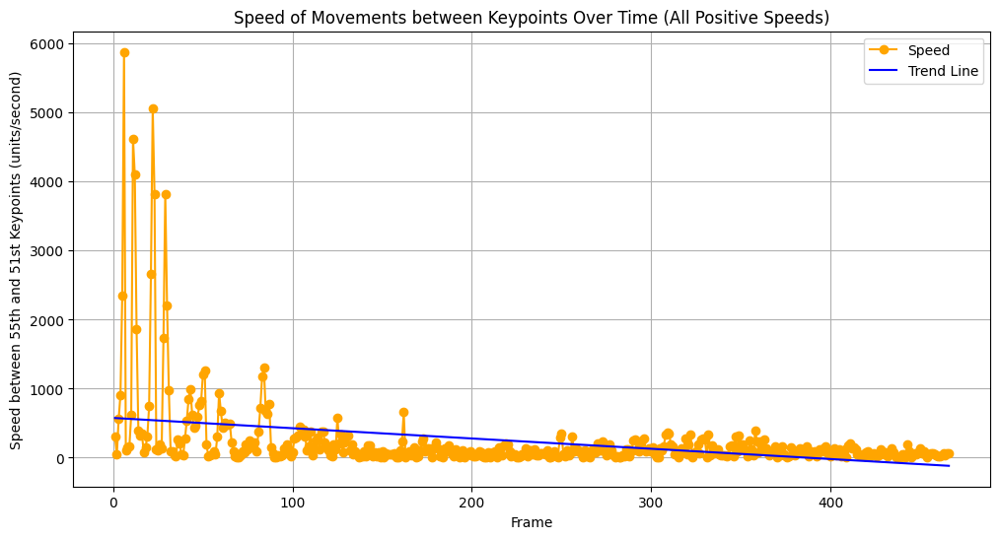

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression


frame_rate = 30  # 30 frames per second
time_interval = 1 / frame_rate  # Time difference between frames

# Calculate the speed as the change in distance over the time interval between frames
speeds = np.abs(np.diff(distances)) / time_interval  # Use absolute value to treat reverse movements as positive

# Create time points for the speed plot (since the speed is calculated between frames)
time_points = np.arange(1, len(speeds) + 1)

# Plot the speed of movements
fig, ax = plt.subplots(figsize=(12, 6))
ax.plot(time_points, speeds, marker='o', color='orange', label='Speed')

# Fit a linear regression line to the speed data
X = time_points.reshape(-1, 1)  # Reshape for sklearn
model = LinearRegression()
model.fit(X, speeds)
regression_line = model.predict(X)

# Plot the regression line
ax.plot(time_points, regression_line, color='blue', linestyle='-', label='Trend Line')

# Set labels and title
ax.set_xlabel("Frame")
ax.set_ylabel("Speed between 55th and 51st Keypoints (units/second)")
ax.set_title("Speed of Movements between Keypoints Over Time (All Positive Speeds)")

# Add grid and legend
plt.grid(True)
plt.legend()

# Show plot
plt.show()


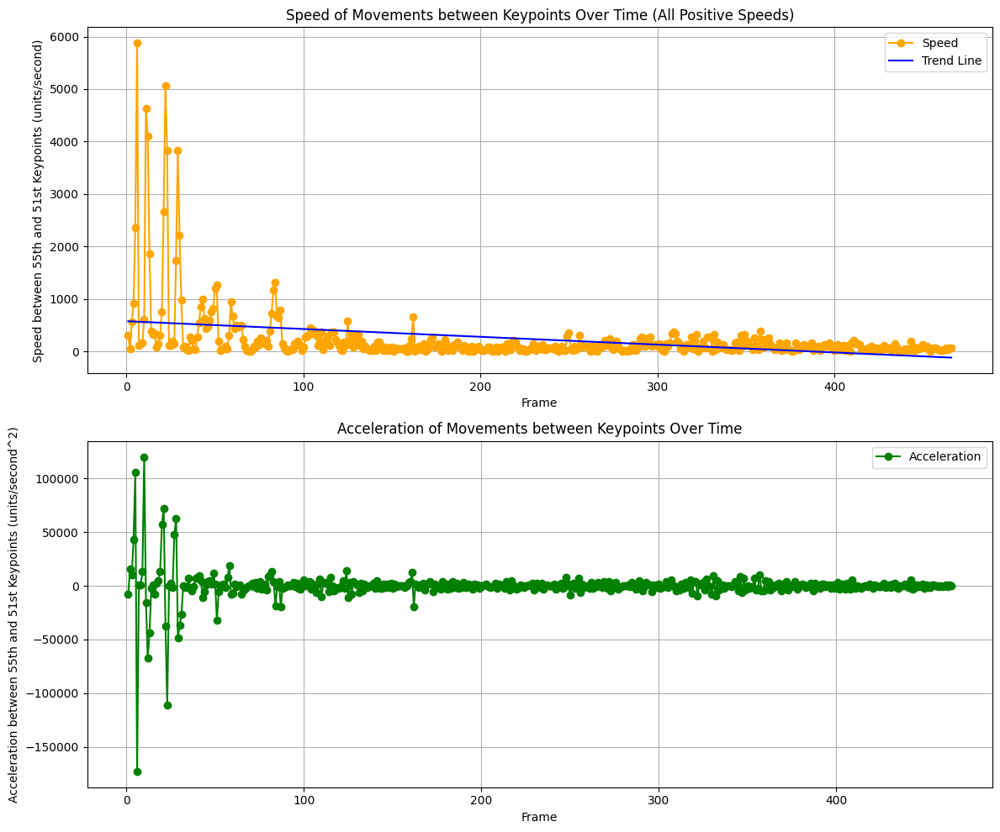

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

frame_rate = 30  # 30 frames per second
time_interval = 1 / frame_rate  # Time difference between frames

# Calculate the speed as the change in distance over the time interval between frames
speeds = np.abs(np.diff(distances)) / time_interval  # Use absolute value to treat reverse movements as positive

# Create time points for the speed plot (since the speed is calculated between frames)
time_points = np.arange(1, len(speeds) + 1)

# Calculate the acceleration as the change in speed over the time interval between frames
accelerations = np.diff(speeds) / time_interval

# Create time points for the acceleration plot (since the acceleration is calculated between frames)
time_points_acceleration = np.arange(1, len(accelerations) + 1)

# Plot the speed and acceleration of movements
fig, axs = plt.subplots(2, figsize=(12, 10))

# Plot the speed
axs[0].plot(time_points, speeds, marker='o', color='orange', label='Speed')
axs[0].set_xlabel("Frame")
axs[0].set_ylabel("Speed between 55th and 51st Keypoints (units/second)")
axs[0].set_title("Speed of Movements between Keypoints Over Time (All Positive Speeds)")

# Fit a linear regression line to the speed data
X = time_points.reshape(-1, 1)  # Reshape for sklearn
model = LinearRegression()
model.fit(X, speeds)
regression_line = model.predict(X)

# Plot the regression line
axs[0].plot(time_points, regression_line, color='blue', linestyle='-', label='Trend Line')
axs[0].grid(True)
axs[0].legend()

# Plot the acceleration
axs[1].plot(time_points_acceleration, accelerations, marker='o', color='green', label='Acceleration')
axs[1].set_xlabel("Frame")
axs[1].set_ylabel("Acceleration between 55th and 51st Keypoints (units/second^2)")
axs[1].set_title("Acceleration of Movements between Keypoints Over Time")
axs[1].grid(True)
axs[1].legend()

# Layout so plots do not overlap
fig.tight_layout()

# Show plot
plt.show()